# Full Image Nucleus Segmentor

In [1]:
import os
import sys

parent = os.path.dirname(os.path.dirname(os.getcwd()))
if parent not in sys.path:
    sys.path.append(parent)
print(parent)

import matplotlib
%matplotlib widget

d:\Documents\git\XAI-Cancer-Diagnosis\XAI-Cancer-Diagnosis


## Preperation

In [2]:
# HOVERNET MODEL

from src.model.architectures.graph_construction.hover_net import HoVerNet
checkpoint_path = os.path.join(parent,"model","HoVerNet_D.ckpt")

cell_seg_model = HoVerNet.load_from_checkpoint(checkpoint_path, RESNET_SIZE=50,START_LR=0,categories=True)

from src.datasets.BACH import BACH
src_folder = os.path.join(parent,"data","processed","BACH_TRAIN")
prc_folder = os.path.join(parent,"data","processed","BACH_TRAIN","INSTANCE_SEGMENTATION")

In [3]:
from src.transforms.graph_construction.hovernet_post_processing import *

def _S(hv_map: Tensor):
    """
    Applies the sobel filter to the hover maps, and gets the importance map from the result.
    Args:
        hv_map (Tensor): hover map of shape (N,2,H,W) and float
    Returns:
        Tensor: The importance map (N,H,W)
    """
    hv_horiz, hv_vert = hv_map
    hpx = sobel(hv_horiz.float())[0].abs()
    # sobel here outputs small numbers for edges and large numbers for cell centres, hence want to invert to get importance (0 for cell centres, 1 for edges)
    hpy = sobel(hv_vert.float())[1].abs()
    return torch.maximum(1-hpx, 1-hpy).squeeze()

def hovernet_post_process(sm: Tensor, hv_map: Tensor, h=0.5, k=0.5, smooth_amt=5):  # todo doc and annotate
    Sm = _S(hv_map)
    thresh_q = (sm > h)
    thresh_q = torch.as_tensor(remove_small_objects(thresh_q.numpy(), min_size=30))
    Sm = (Sm - (1-thresh_q.float())).clip(0)  # importance regions with background haze removed via mask with clipping

    # to get areas of low importance (i.e. centre of cells) as high energy and areas close to border are low energy
    energy = (1-Sm)*thresh_q
    # also clip again background
    energy = torch.as_tensor(cv2.GaussianBlur(energy.numpy(), (smooth_amt, smooth_amt), 0)
                             )  # smooth landscape # especially important for long cells

    markers = (thresh_q.float() - (Sm > k).float())
    markers = label(markers)[0]
    # Slightly different to paper - I use the energy levels instead because they have been smoothed
    markersv2 = (energy > k).numpy()
    markersv2 = binary_fill_holes(markersv2)
    markersv2 = label(markersv2)[0]
    final = watershed(-energy.numpy(), markers=markersv2, mask=thresh_q.numpy())
    final = reset_ids(final)
    return torch.as_tensor(final, dtype=torch.int)

In [4]:
# DATA

from tqdm import tqdm
from PIL import Image
from src.transforms.graph_construction.hovernet_post_processing import *
from torchvision.transforms import Compose, ToTensor, Normalize
from torchvision.transforms.functional import adjust_sharpness
from src.utilities.img_utilities import tensor_to_numpy
import matplotlib.pyplot as plt
from src.vizualizations.cellseg_viz import instance_segmentation_vizualised
from threading import Thread
from src.utilities.img_utilities import tensor_to_numpy
from src.vizualizations.image_viz import plot_images
tile_size = 128
img_id = 1

normalizer = Normalize((0.6441, 0.4474, 0.6039), (0.1892, 0.1922, 0.1535))


img = ToTensor()(Image.open(BACH(src_folder).original_image_paths[img_id]))
img_norm = normalizer(img)

    

output = instance_mask_prediction_hovernet(cell_seg_model,img_norm,tile_size=128,pre_normalized=True,all_channels=True)


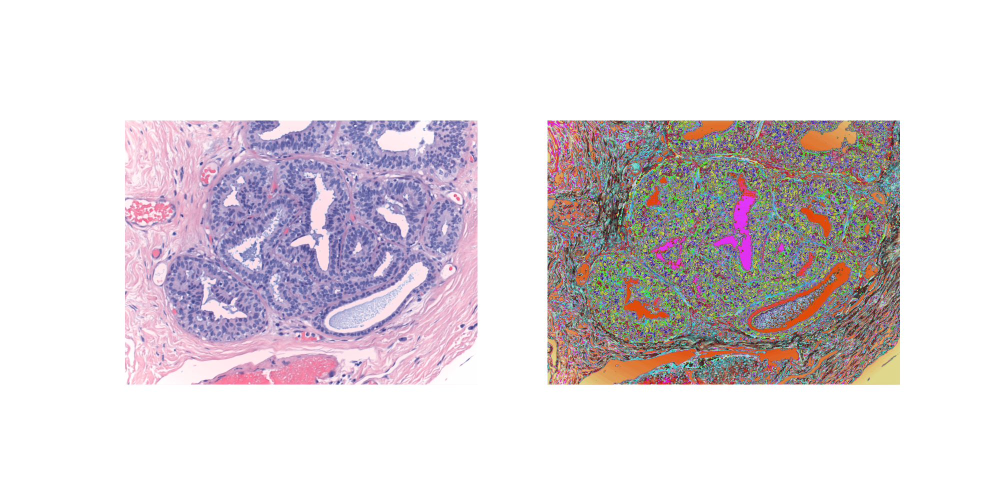

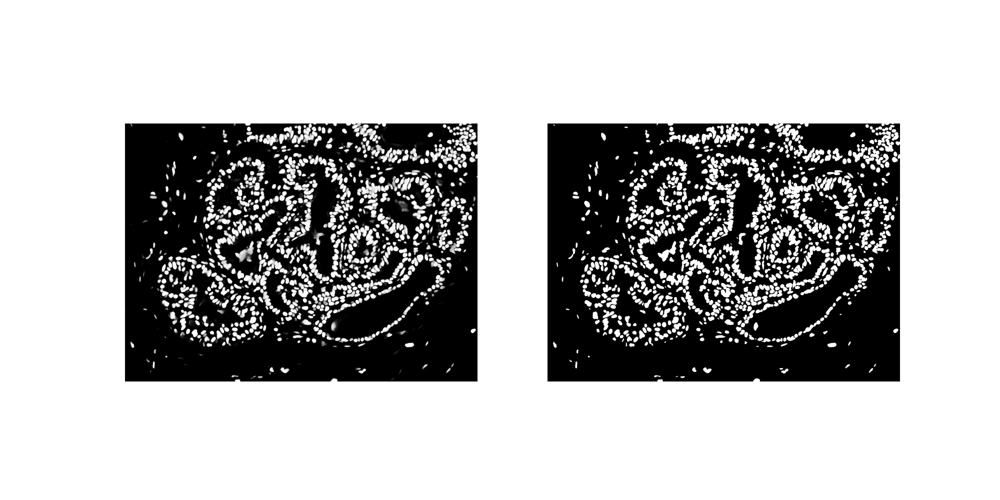

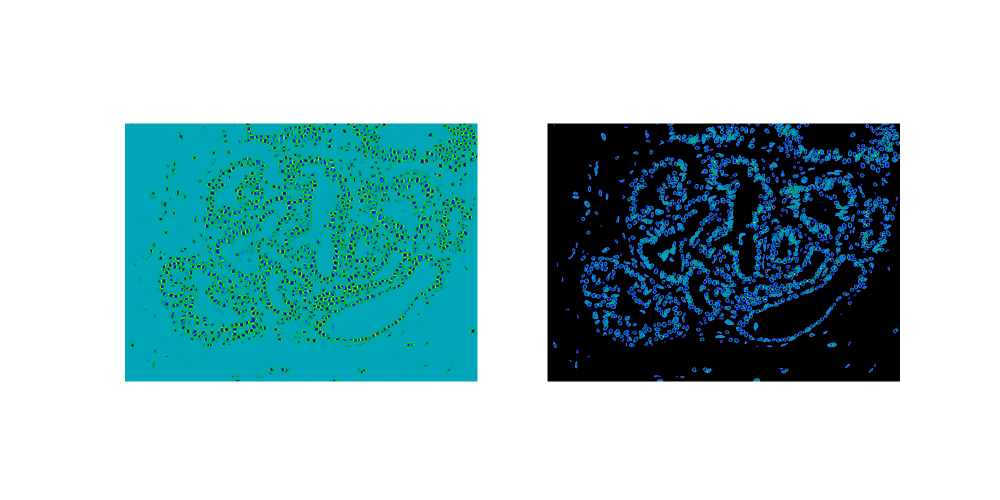

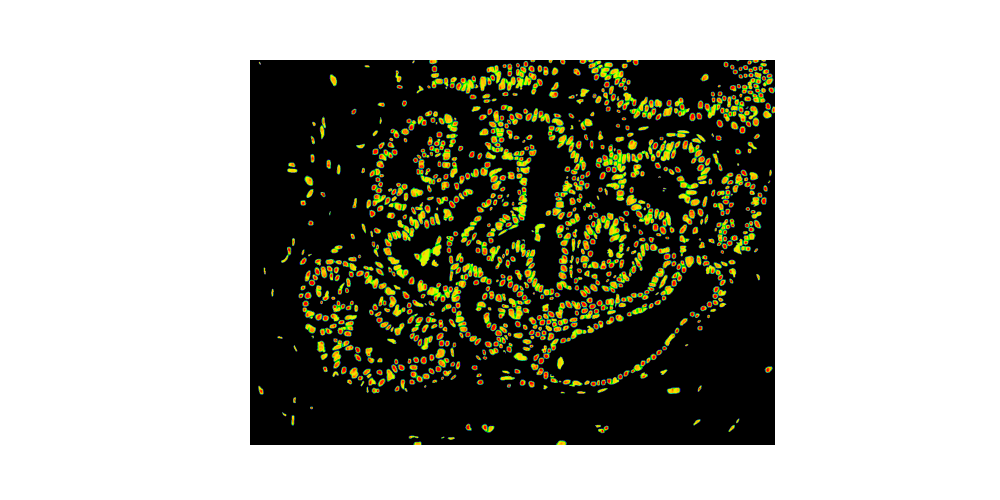

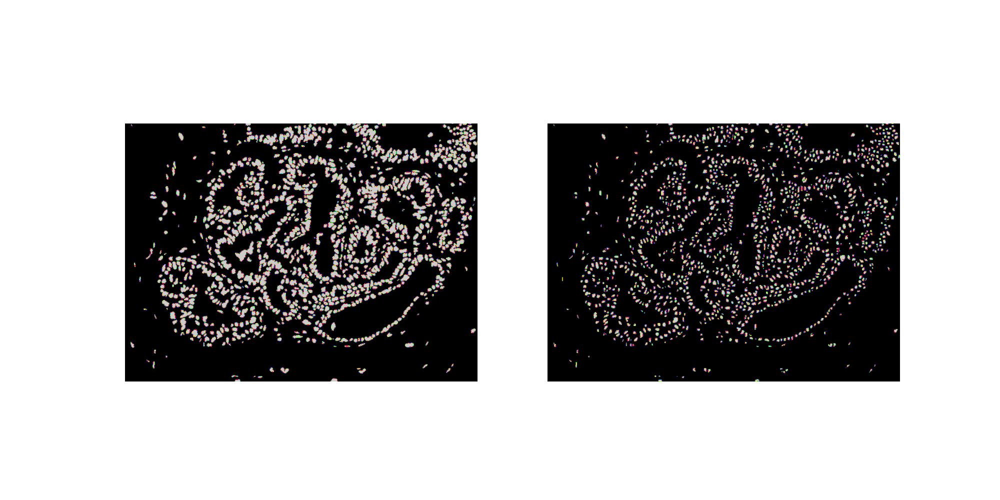

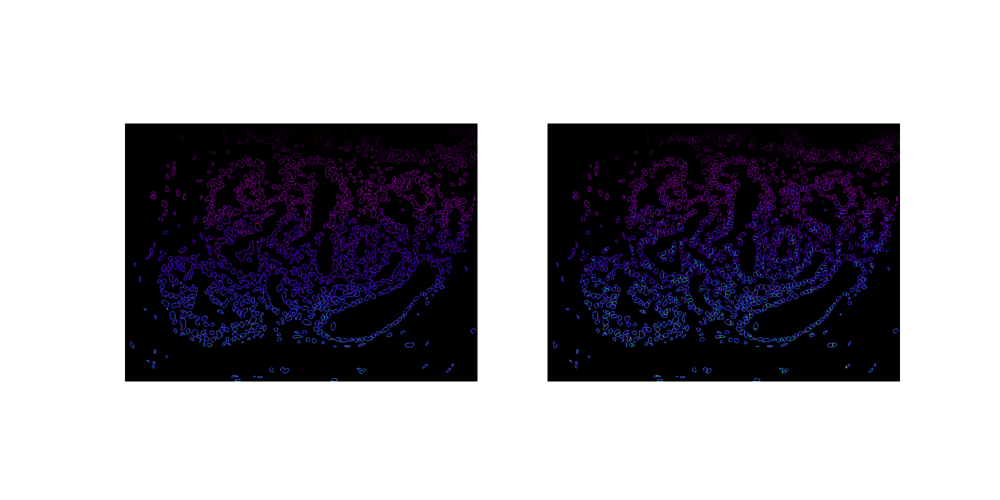

In [6]:
from src.transforms.graph_construction.percolation import hollow
h=0.5
k = 0.7
smooth_amt = 1

figsize=(20,10)
def generate_visualizations(img,img_norm,output): # USE OF SHARPEN IS IMPORTANT TO CREATE MORE DISTINCTIVE CELLS
    """Generate a series of visualizations for the given image"""

    
    
    
    
    
    
    hv = output[3]
    sm = output[2]
    
    Sm = _S(hv)
    thresh_q = (sm > h)
    thresh_q = torch.as_tensor(remove_small_objects(thresh_q.numpy(), min_size=30))
    Sm_clipped = (Sm - (1-thresh_q.float())).clip(0)
    
    energy = (1-Sm)*thresh_q
    # also clip again background
    energy = torch.as_tensor(cv2.GaussianBlur(energy.numpy(), (smooth_amt, smooth_amt), 0)
                             )  # smooth landscape # especially important for long cells
    
    
   
    plot_images([img,img_norm],dimensions=(1,2),figsize=figsize,cmap="gray")
    plot_images([sm,thresh_q.int().numpy()],dimensions=(1,2),figsize=figsize,cmap="gray")
    #plot_images([hv[0].numpy()],figsize=figsize,cmap="jet")
    #plot_images([hv[1].numpy()],figsize=figsize,cmap="jet")
    plot_images([Sm,Sm_clipped],dimensions=(1,2),figsize=figsize)
    plot_images([energy],dimensions=(1,1),figsize=figsize)
    
     
    markers = (thresh_q.float() - (Sm > k).float())
    markersv2 = (energy > k).numpy()
    plot_images([markers,markersv2],dimensions=(1,2),figsize=figsize)
    
    
    markers = label(markers)[0]
    markersv2 = binary_fill_holes(markersv2)
    markersv2 = label(markersv2)[0]
    final_1 = watershed(-energy.numpy(), markers=markers, mask=thresh_q.numpy())
    final_1 = hollow(torch.as_tensor(reset_ids(final_1)))
    final_2 = watershed(-energy.numpy(), markers=markersv2, mask=thresh_q.numpy())
    final_2 = hollow(torch.as_tensor(reset_ids(final_2)))
    
    plot_images([final_1,final_2],dimensions=(1,2),figsize=figsize)
    
    
generate_visualizations(img,img_norm,output)